In [1]:

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
import keras_tuner
import keras
import tensorflow as tf

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

%matplotlib inline

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


/kaggle/input/playground-series-s3e26/sample_submission.csv
/kaggle/input/playground-series-s3e26/train.csv
/kaggle/input/playground-series-s3e26/test.csv


# About Dataset

* ID:Unique identifier for each patient in the dataset.
* N_Days:Number of days between registration and the earlier of death, transplantation, or study analysis time in July 1986.
* Status:Patient status: C (censored), CL (censored due to liver tx), or D (death).
* Drug:Type of drug administered, either D-penicillamine or placebo.
* Age:Age of the patient in days.
* Sex:Gender of the patient, either male (M) or female (F).
* Ascites:Presence of ascites: N (No) or Y (Yes).
* Hepatomegaly:Presence of hepatomegaly: N (No) or Y (Yes).
* Spiders:Presence of spider angiomas: N (No) or Y (Yes).
* Edema:Presence of edema: N (No edema and no diuretic therapy), S (edema present without diuretics, or resolved by diuretics), or Y (edema despite diuretic therapy).
* Bilirubin:Serum bilirubin concentration in mg/dl.
* Cholesterol:Serum cholesterol concentration in mg/dl.
* Albumin:Albumin concentration in gm/dl.
* Copper:Urine copper amount in ug/day.
* Alk_Phos:Alkaline phosphatase concentration in U/liter.
* SGOT:Serum glutamic oxaloacetic transaminase (SGOT) concentration in U/ml.
* Triglycerides:Triglycerides concentration in mg/dl.
* Platelets:Platelet count per cubic ml/1000.
* Prothrombin:Prothrombin time in seconds (s).
* Stage:Histologic stage of disease: 'D', 'C', 'CL'

# DATA

In [2]:
train_data = pd.read_csv('/kaggle/input/playground-series-s3e26/train.csv')

train_data.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,999,D-penicillamine,21532,M,N,N,N,N,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,D
1,1,2574,Placebo,19237,F,N,N,N,N,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,C
2,2,3428,Placebo,13727,F,N,Y,Y,Y,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,D
3,3,2576,Placebo,18460,F,N,N,N,N,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,C
4,4,788,Placebo,16658,F,N,Y,N,N,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,C


In [3]:
train_data.shape

(7905, 20)

* Status is the categorical target;
* **C** indicates the patient was alive at **N_Days**,
* **CL** indicates the patient was alive at **N_Days** due to liver a transplant,
* **D** indicates the patient was deceased at **N_Days**.

In [4]:
test_data = pd.read_csv('/kaggle/input/playground-series-s3e26/test.csv')
test_data.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,7905,3839,D-penicillamine,19724,F,N,Y,N,N,1.2,546.0,3.37,65.0,1636.0,151.90,90.0,430.0,10.6,2.0
1,7906,2468,D-penicillamine,14975,F,N,N,N,N,1.1,660.0,4.22,94.0,1257.0,151.90,155.0,227.0,10.0,2.0
2,7907,51,Placebo,13149,F,N,Y,N,Y,2.0,151.0,2.96,46.0,961.0,69.75,101.0,213.0,13.0,4.0
3,7908,2330,D-penicillamine,20510,F,N,N,N,N,0.6,293.0,3.85,40.0,554.0,125.55,56.0,270.0,10.6,2.0
4,7909,1615,D-penicillamine,21904,F,N,Y,N,N,1.4,277.0,2.97,121.0,1110.0,125.00,126.0,221.0,9.8,1.0


In [5]:
test_data.shape

(5271, 19)

# EDA

In [6]:
def summary(df):
    print(f'data shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['#missing'] = df.isnull().sum().values
    summ['%missing'] = df.isnull().sum().values / len(df)* 100
    summ['#unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    return summ

In [7]:
summary(train_data).style.background_gradient(cmap='Blues')

data shape: (7905, 20)


,data type,#missing,%missing,#unique,min,max
id,int64,0,0.000000,7905,0.000000,7904.000000
N_Days,int64,0,0.000000,461,41.000000,4795.000000
Drug,object,0,0.000000,2,nan,nan
Age,int64,0,0.000000,391,9598.000000,28650.000000
Sex,object,0,0.000000,2,nan,nan
Ascites,object,0,0.000000,2,nan,nan
Hepatomegaly,object,0,0.000000,2,nan,nan
Spiders,object,0,0.000000,2,nan,nan
Edema,object,0,0.000000,3,nan,nan
Bilirubin,float64,0,0.000000,111,0.300000,28.000000


# Visualization

## Univariate Analysis:

###  Histograms for numerical columns

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


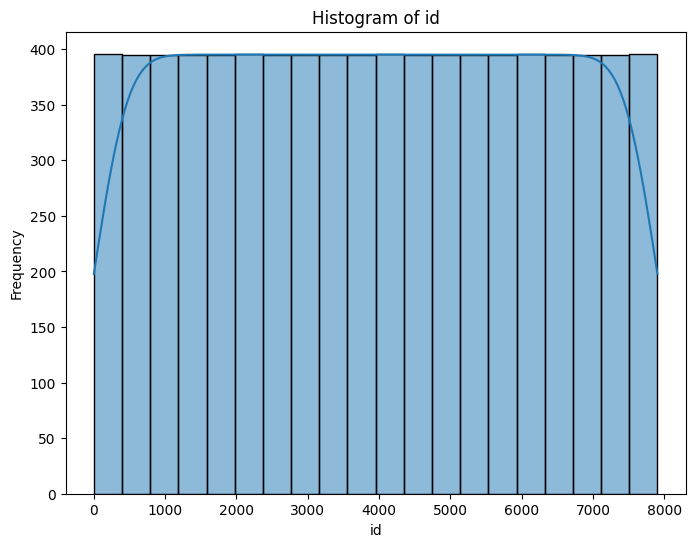

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


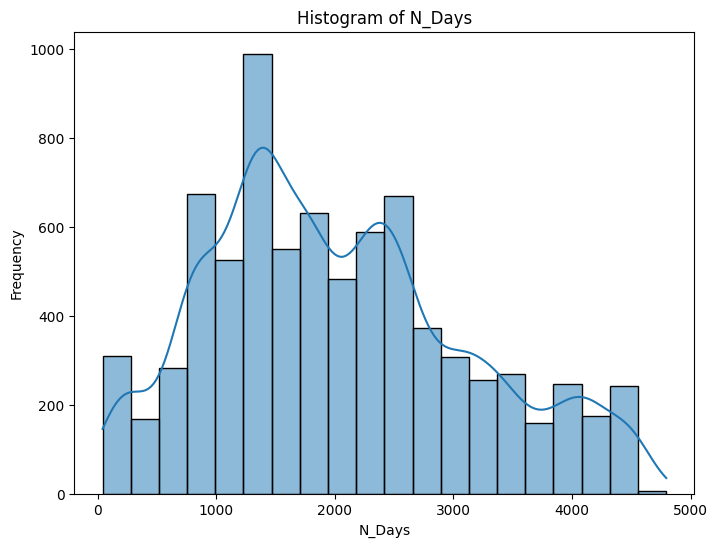

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


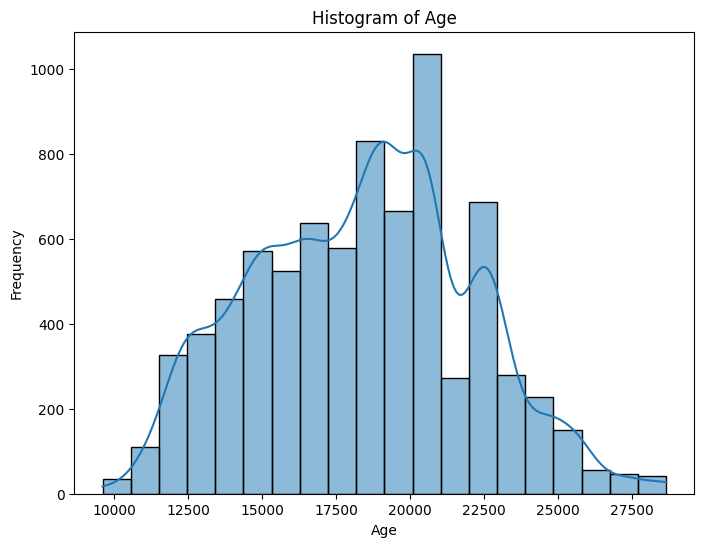

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


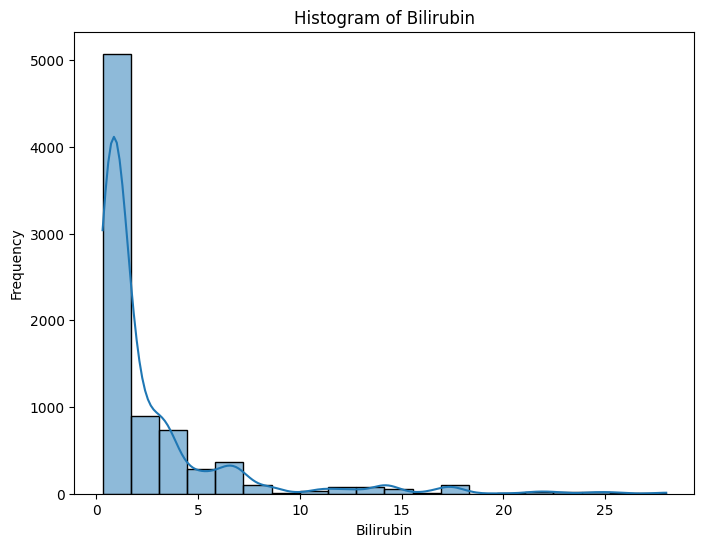

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


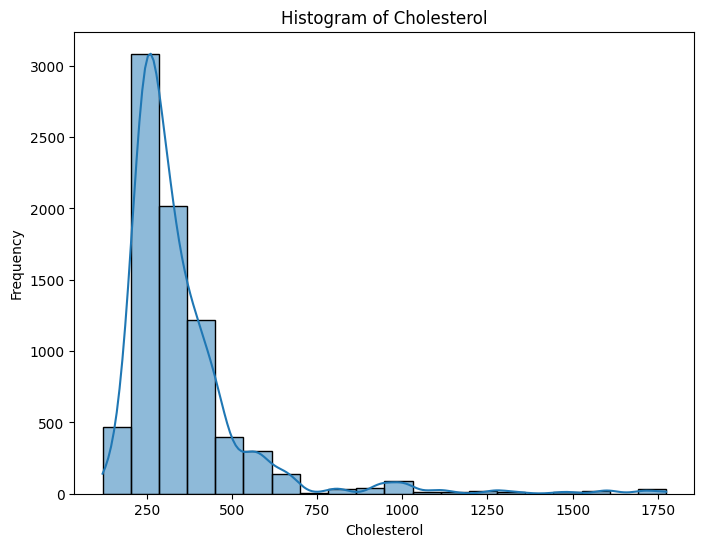

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


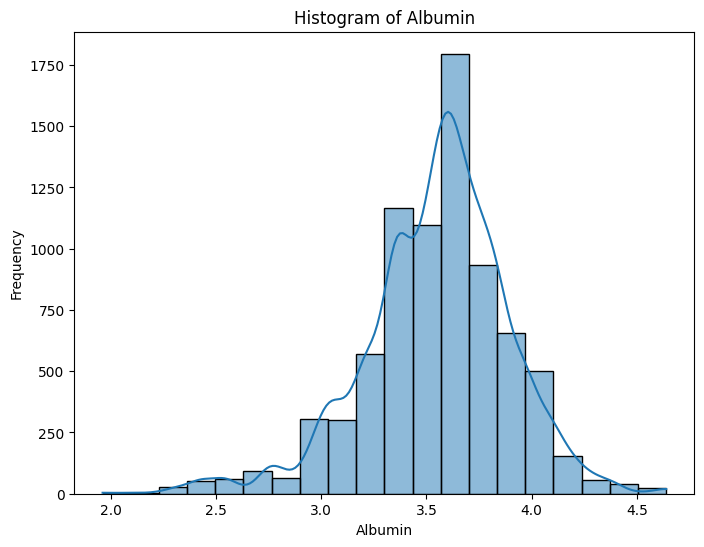

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


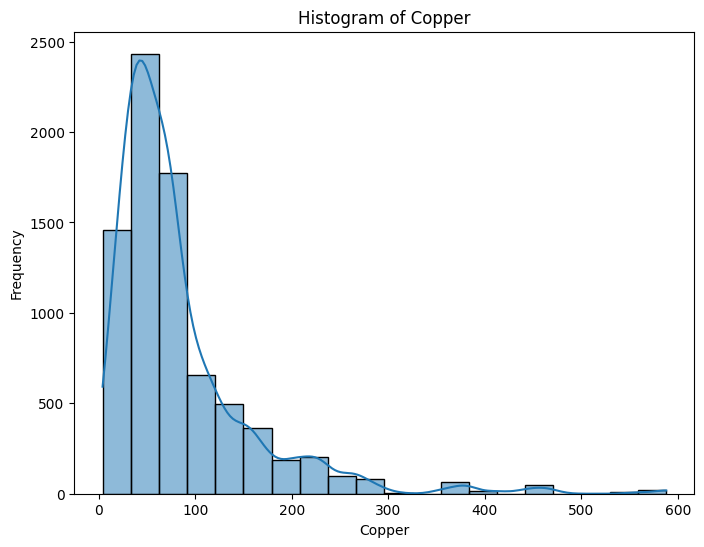

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


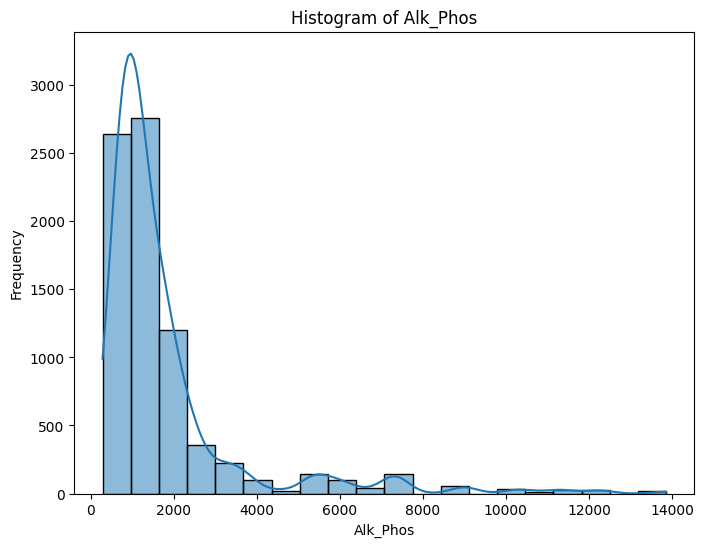

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


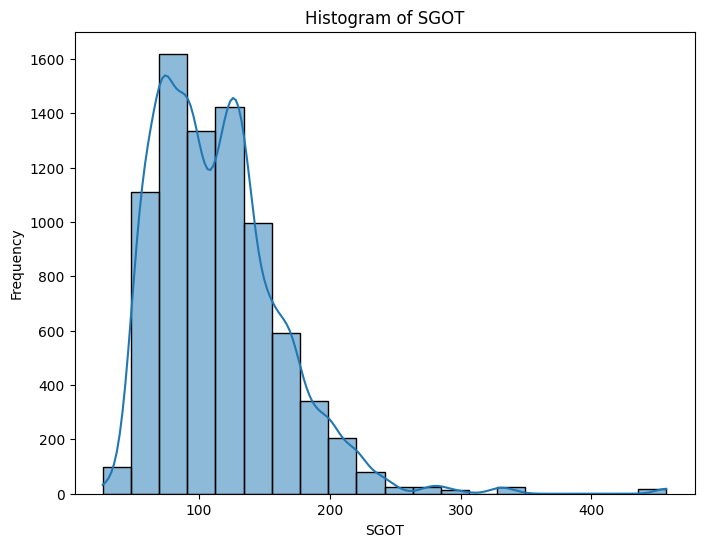

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


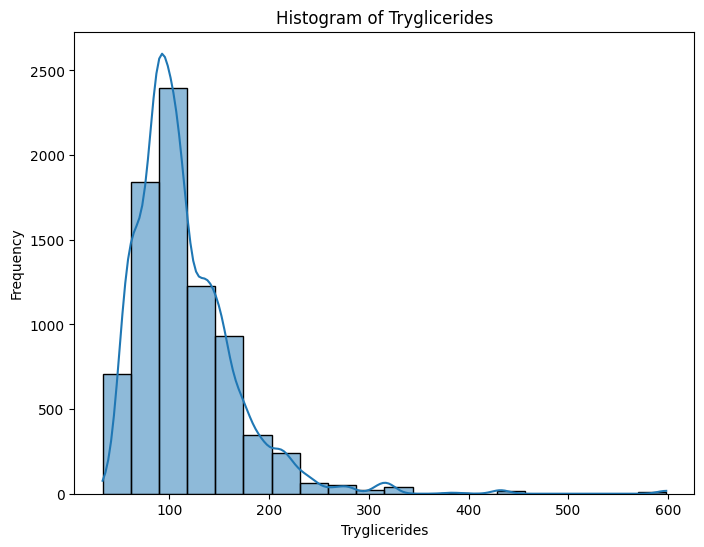

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


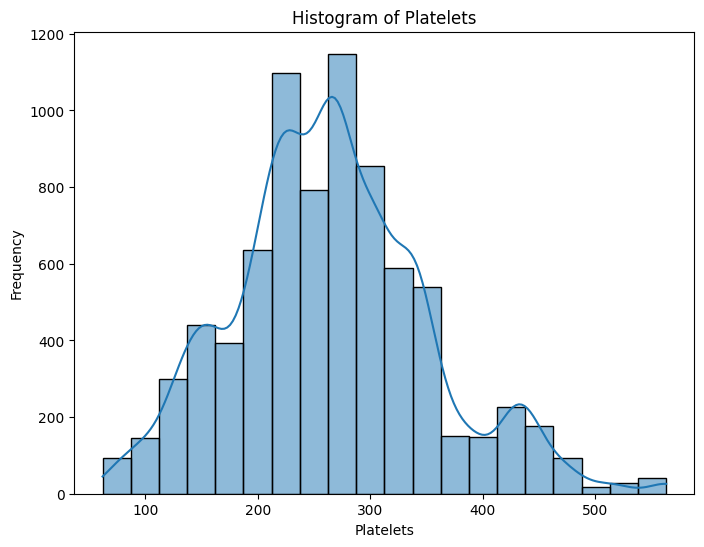

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


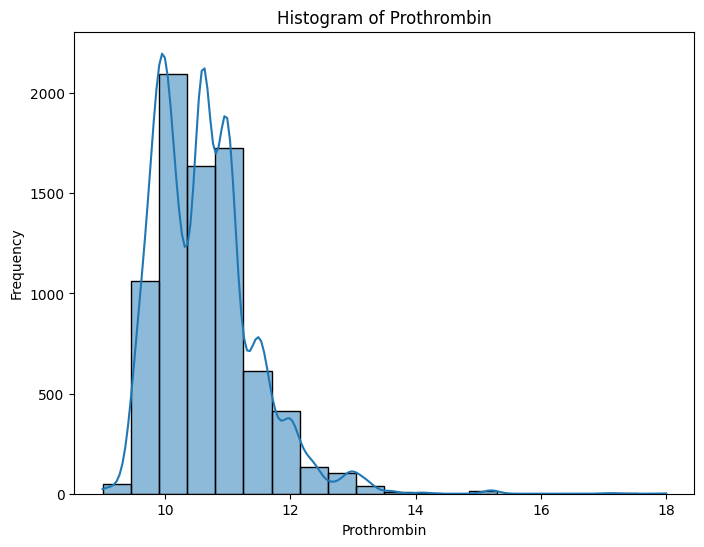

/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


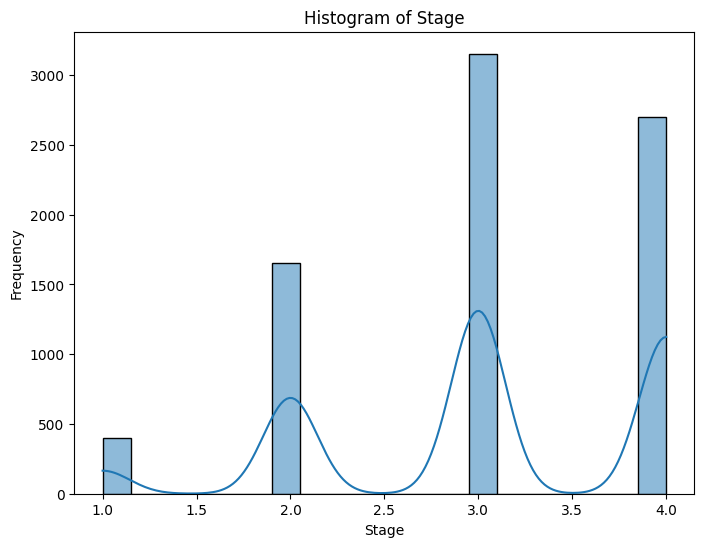

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# List of columns excluding 'Status'
numerical_columns = train_data.select_dtypes(include=['int64', 'float64']).columns

# Plot histograms for numerical columns
for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(train_data[column], bins=20, kde=True)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

### Countplots for categorical columns


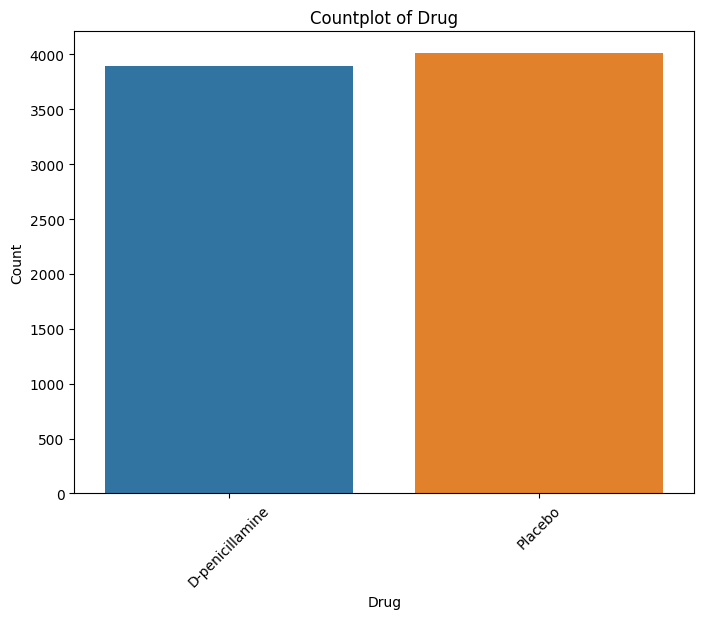

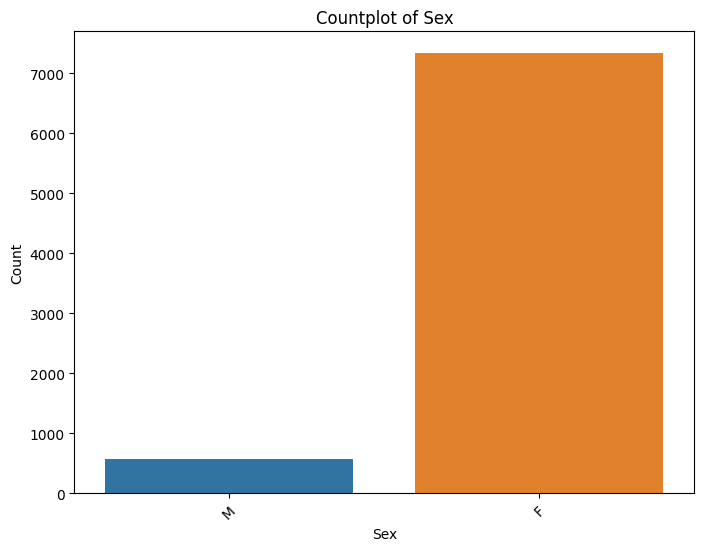

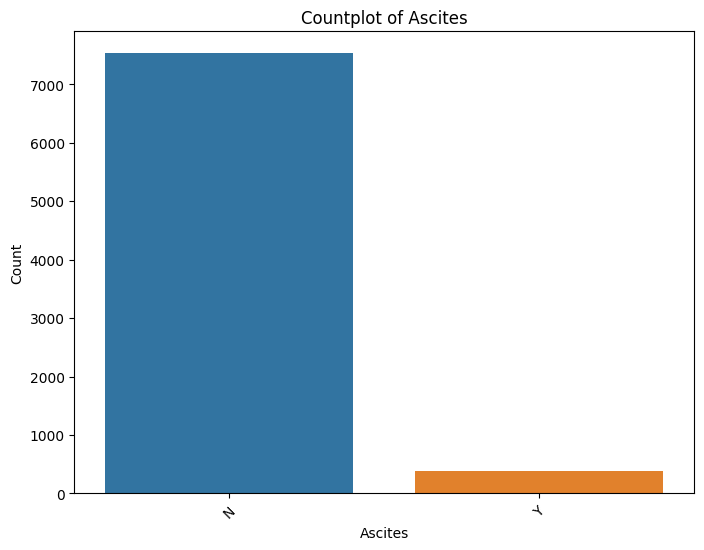

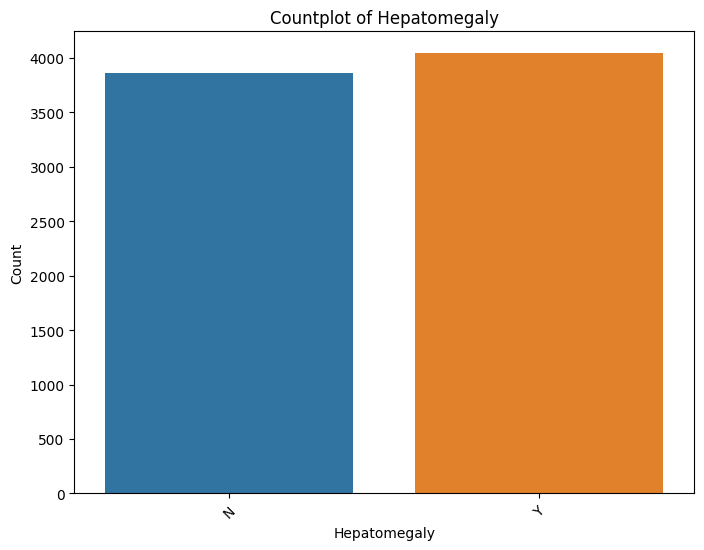

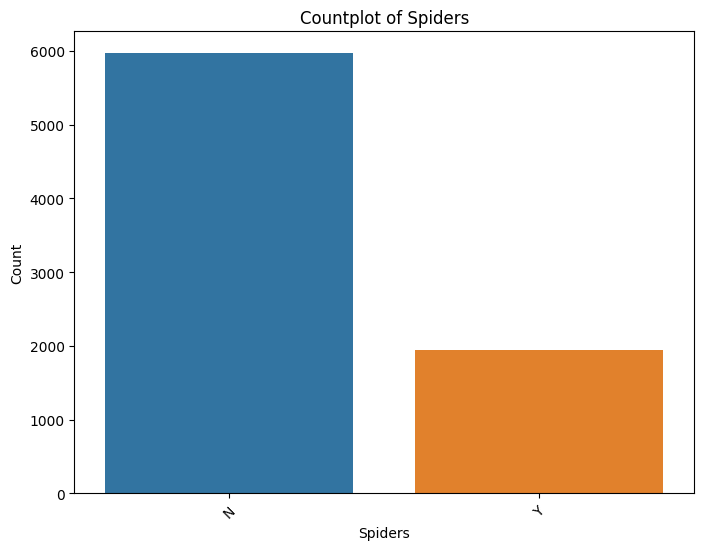

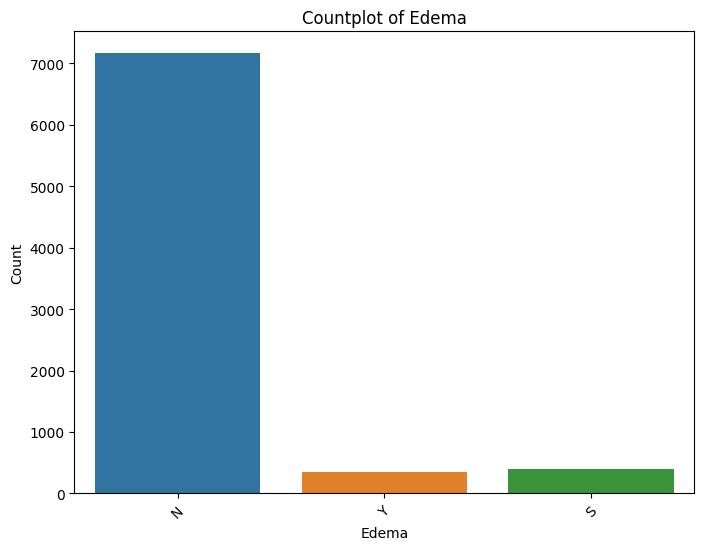

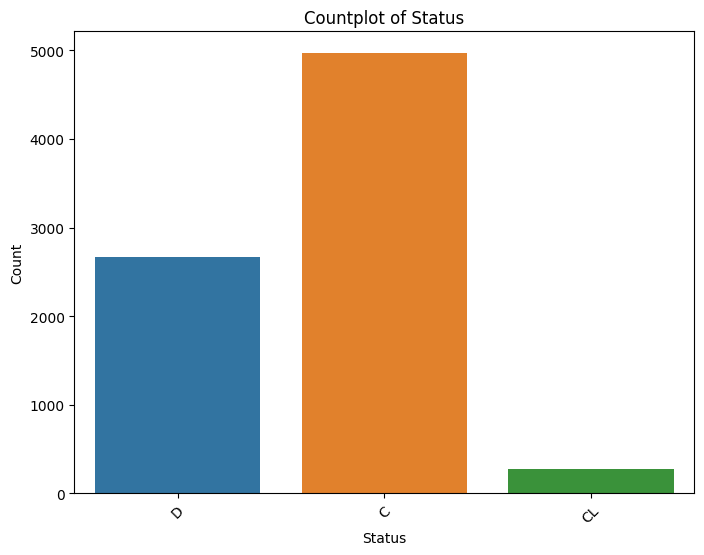

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd


# List of columns excluding 'Status'
categorical_columns = train_data.select_dtypes(include=['object']).columns

# Plot countplots for categorical columns
for column in categorical_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(x=column, data=train_data)
    plt.title(f'Countplot of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()  # Display the plot explicitly

## Bivariate Analysis:


### Pairplot for numerical columns against 'Status'


/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

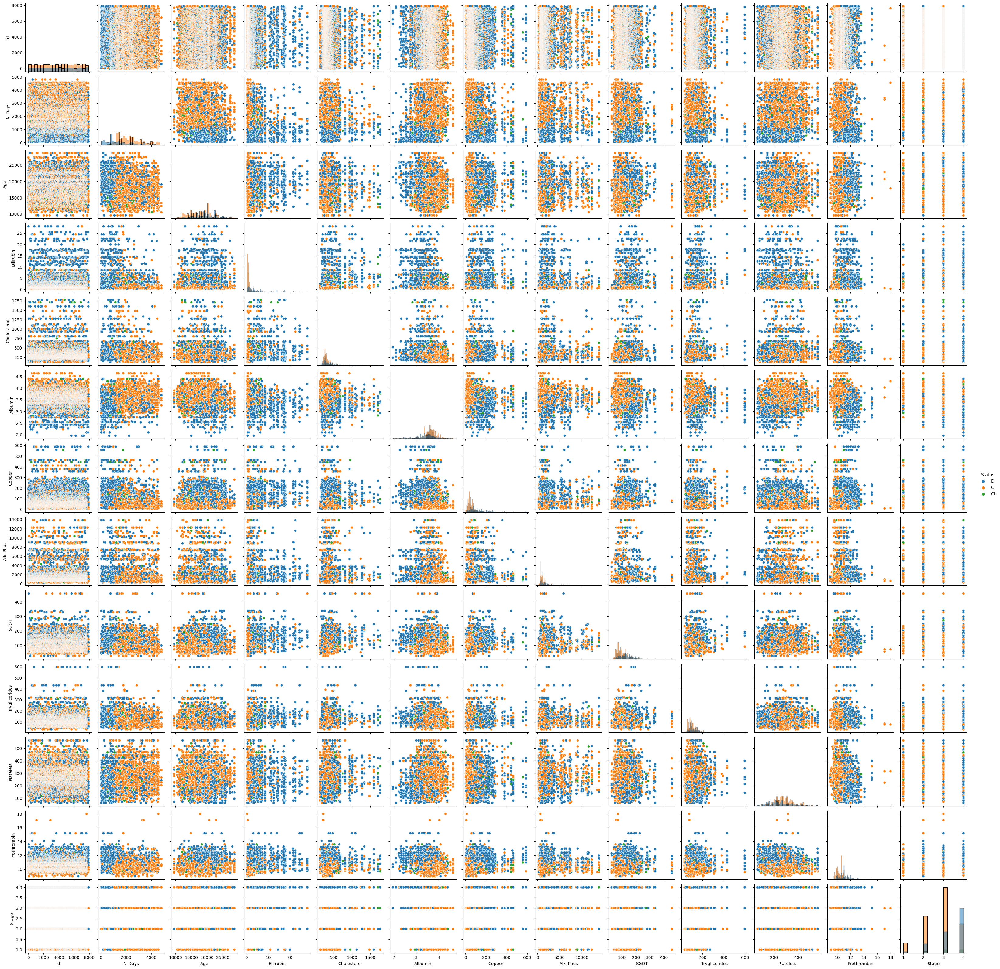

In [10]:
# Create a pairplot for numerical columns against 'Status'
sns.pairplot(train_data, vars=numerical_columns, hue='Status', diag_kind='hist')
plt.show()

### Boxplots for numerical columns against 'Status'


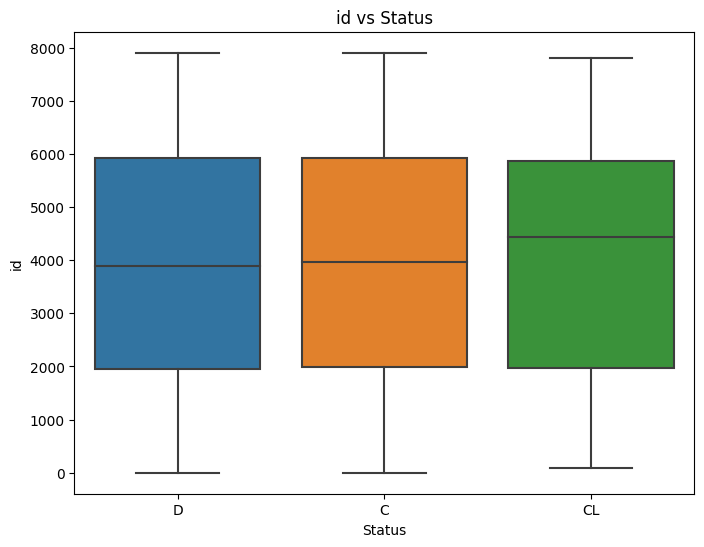

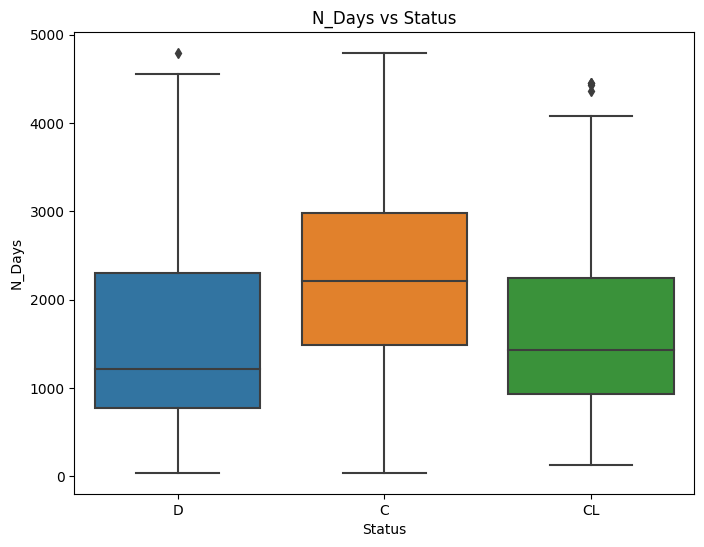

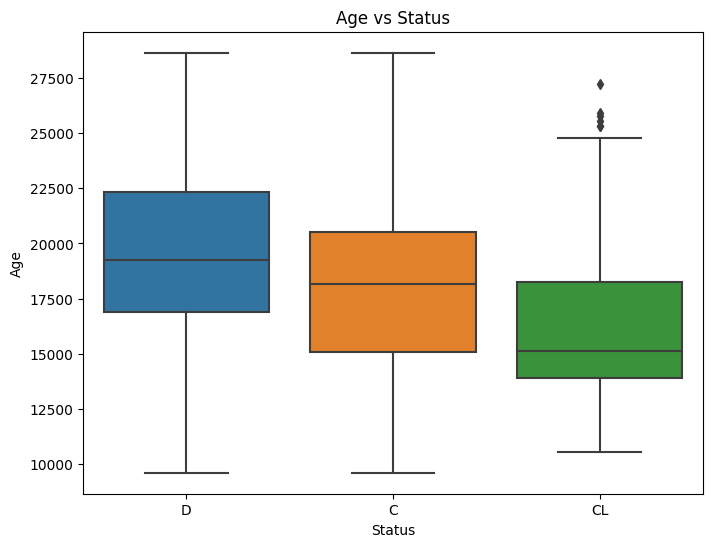

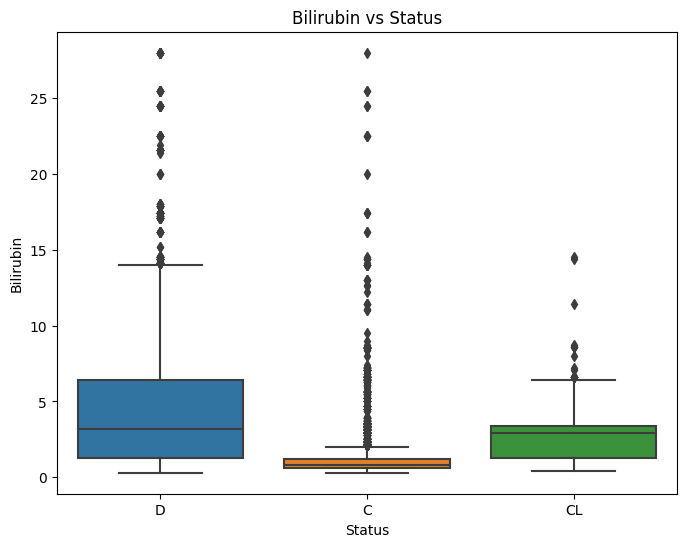

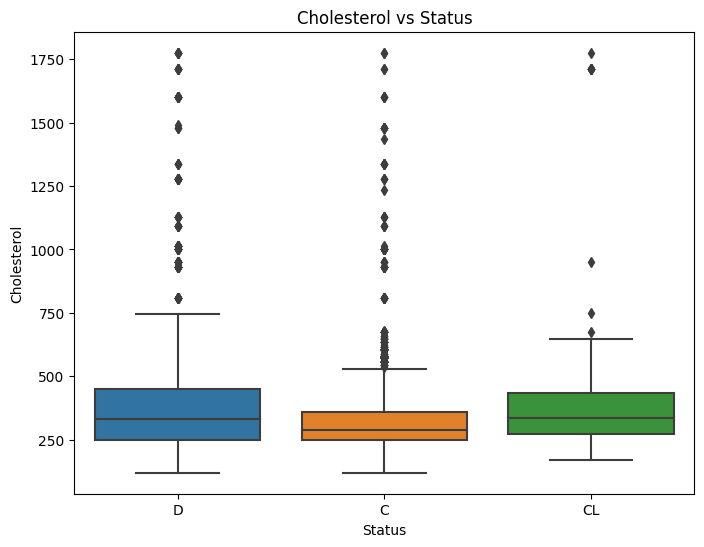

...

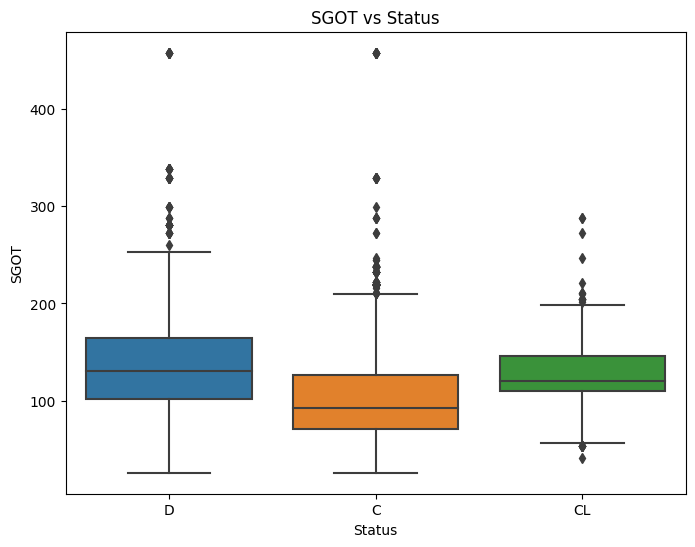

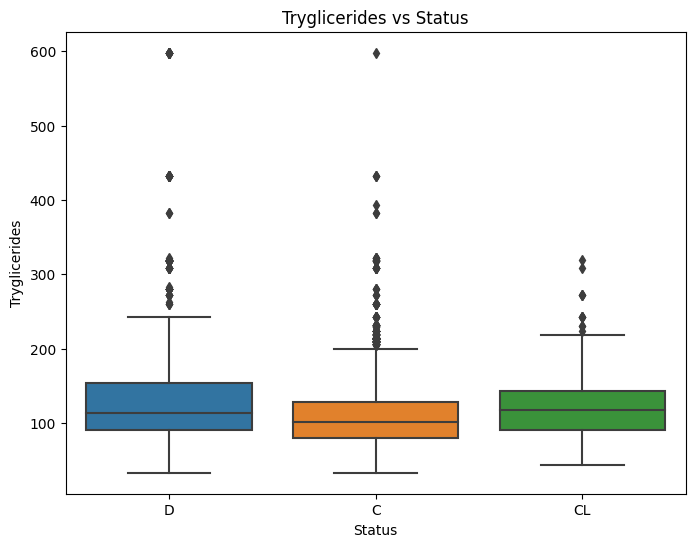

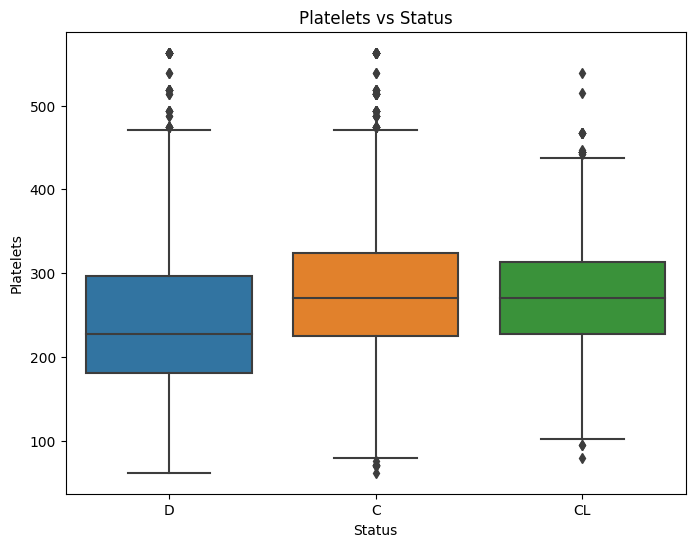

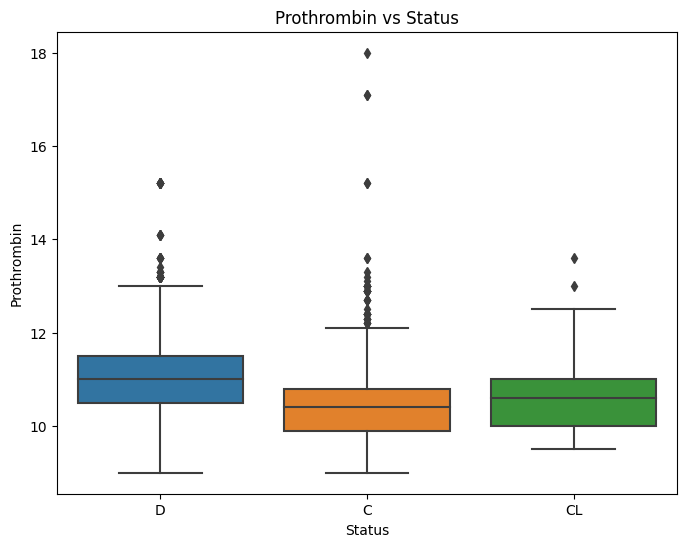

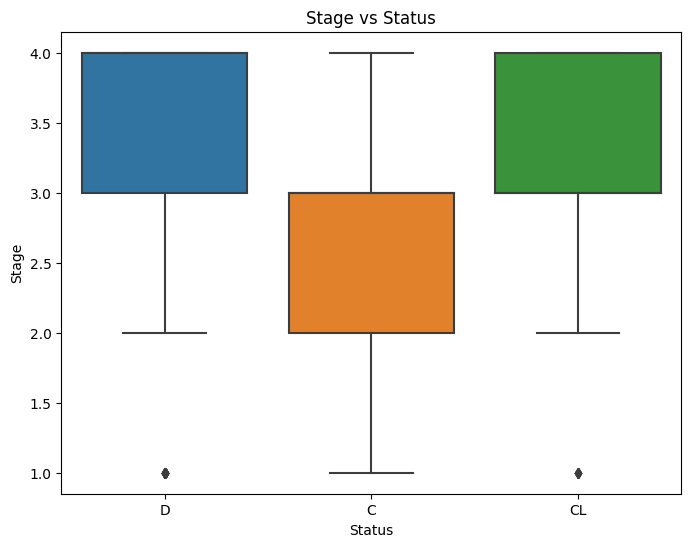

In [11]:
# Boxplots for numerical columns against 'Status'
for column in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x='Status', y=column, data=train_data)
    plt.title(f'{column} vs Status')
    plt.xlabel('Status')
    plt.ylabel(column)
    plt.show()

### Heatmap for correlation between numerical columns


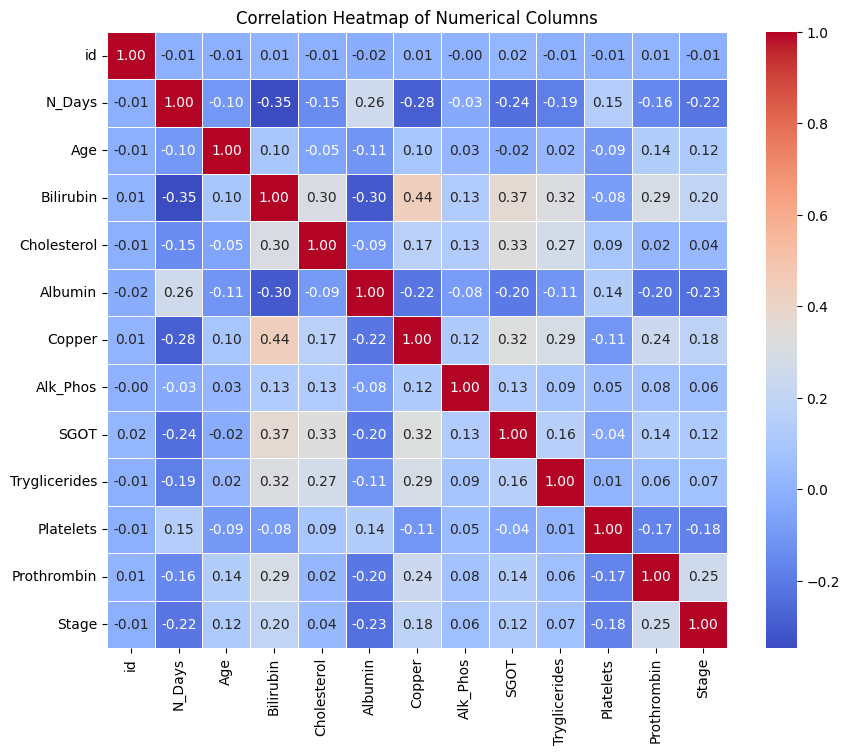

In [12]:
# Create a heatmap to visualize correlation between numerical columns
plt.figure(figsize=(10, 8))
sns.heatmap(train_data[numerical_columns].corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Columns')
plt.show()


# Encoder

In [13]:
train_data["Drug"] = train_data["Drug"].map({"Placebo": 0,"D-penicillamine":1})
test_data["Drug"] = test_data["Drug"].map({"Placebo": 0,"D-penicillamine":1})

train_data["Sex"] = train_data["Sex"].map({"M": 0,"F":1})
test_data["Sex"] = test_data["Sex"].map({"M": 0,"F":1})


train_data["Edema"] = train_data["Edema"].map({"N": 0,"Y":1, "S":2})
test_data["Edema"] = test_data["Edema"].map({"N": 0,"Y":1, "S":2})

for col in ["Ascites", "Hepatomegaly", "Spiders"]:
    train_data[col] = train_data[col].map({"N": 0, "Y": 1})
    test_data[col] = test_data[col].map({"N": 0, "Y": 1})

train_data['Status'] = train_data['Status'].map({"D": 0, "CL": 1, "C": 2})   

In [14]:
train_data.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,999,1,21532,0,0,0,0,0,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,0
1,1,2574,0,19237,1,0,0,0,0,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,2
2,2,3428,0,13727,1,0,1,1,1,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,0
3,3,2576,0,18460,1,0,0,0,0,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,2
4,4,788,0,16658,1,0,1,0,0,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,2


In [15]:
test_data.head()


,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,7905,3839,1,19724,1,0,1,0,0,1.2,546.0,3.37,65.0,1636.0,151.90,90.0,430.0,10.6,2.0
1,7906,2468,1,14975,1,0,0,0,0,1.1,660.0,4.22,94.0,1257.0,151.90,155.0,227.0,10.0,2.0
2,7907,51,0,13149,1,0,1,0,1,2.0,151.0,2.96,46.0,961.0,69.75,101.0,213.0,13.0,4.0
3,7908,2330,1,20510,1,0,0,0,0,0.6,293.0,3.85,40.0,554.0,125.55,56.0,270.0,10.6,2.0
4,7909,1615,1,21904,1,0,1,0,0,1.4,277.0,2.97,121.0,1110.0,125.00,126.0,221.0,9.8,1.0


In [16]:
train_data.describe()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
count,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000,7905.000000
mean,3952.000000,2030.173308,0.492726,18373.146490,0.928020,0.048071,0.511322,0.245288,0.144592,2.594485,350.561923,3.548323,83.902846,1816.745250,114.604602,115.340164,265.228969,10.629462,3.032511,1.290955
std,2282.121272,1094.233744,0.499979,3679.958739,0.258471,0.213929,0.499903,0.430285,0.473986,3.812960,195.379344,0.346171,75.899266,1903.750657,48.790945,52.530402,87.465579,0.781735,0.866511,0.938439
min,0.000000,41.000000,0.000000,9598.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.300000,120.000000,1.960000,4.000000,289.000000,26.350000,33.000000,62.000000,9.000000,1.000000,0.000000
25%,1976.000000,1230.000000,0.000000,15574.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.700000,248.000000,3.350000,39.000000,834.000000,75.950000,84.000000,211.000000,10.000000,2.000000,0.000000
50%,3952.000000,1831.000000,0.000000,18713.000000,1.000000,0.000000,1.000000,0.000000,0.000000,1.100000,298.000000,3.580000,63.000000,1181.000000,108.500000,104.000000,265.000000,10.600000,3.000000,2.000000
75%,5928.000000,2689.000000,1.000000,20684.000000,1.000000,0.000000,1.000000,0.000000,0.000000,3.000000,390.000000,3.770000,102.000000,1857.000000,137.950000,139.000000,316.000000,11.000000,4.000000,2.000000
max,7904.000000,4795.000000,1.000000,28650.000000,1.000000,1.000000,1.000000,1.000000,2.000000,28.000000,1775.000000,4.640000,588.000000,13862.400000,457.250000,598.000000,563.000000,18.000000,4.000000,2.000000


* The min and max values for each feature are in very different ranges. We will use the standard scaler to move the features to the same region (normalization)

# Preparing Datasets for modeling

In [17]:
train_data.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage,Status
0,0,999,1,21532,0,0,0,0,0,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0,0
1,1,2574,0,19237,1,0,0,0,0,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0,2
2,2,3428,0,13727,1,0,1,1,1,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0,0
3,3,2576,0,18460,1,0,0,0,0,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0,2
4,4,788,0,16658,1,0,1,0,0,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0,2


In [18]:
X = train_data.drop(columns="Status", axis=1)
y=  train_data["Status"]


In [19]:
X.head()

,id,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,0,999,1,21532,0,0,0,0,0,2.3,316.0,3.35,172.0,1601.0,179.80,63.0,394.0,9.7,3.0
1,1,2574,0,19237,1,0,0,0,0,0.9,364.0,3.54,63.0,1440.0,134.85,88.0,361.0,11.0,3.0
2,2,3428,0,13727,1,0,1,1,1,3.3,299.0,3.55,131.0,1029.0,119.35,50.0,199.0,11.7,4.0
3,3,2576,0,18460,1,0,0,0,0,0.6,256.0,3.50,58.0,1653.0,71.30,96.0,269.0,10.7,3.0
4,4,788,0,16658,1,0,1,0,0,1.1,346.0,3.65,63.0,1181.0,125.55,96.0,298.0,10.6,4.0


In [20]:
y.head()


0    0
1    2
2    0
3    2
4    2
Name: Status, dtype: int64

In [21]:
X.drop(columns="id", axis=1, inplace=True)

## Using Resampling Libraries:
Python offers libraries like imbalanced-learn that provide various methods to address class imbalance.

In [22]:
from imblearn.over_sampling import SMOTE
X_array = X.values
y_array = y.values

X_resampled, y_resampled = SMOTE().fit_resample(X, y)

In [23]:
X.shape, X_resampled.shape

((7905, 18), (14895, 18))

In [24]:
y.shape, y_resampled.shape

((7905,), (14895,))

In [25]:
from sklearn.preprocessing import OneHotEncoder

# Reshape y_resampled to a DataFrame if it's a Series
y_resampled_df = pd.DataFrame(y_resampled)

# Initialize the OneHotEncoder
one_hot_encoder = OneHotEncoder()

# Fit and transform the OneHotEncoder on y_resampled
y_resampled_one_hot = one_hot_encoder.fit_transform(y_resampled_df)

# Convert the sparse matrix to a dense NumPy array if needed
y_resampled_one_hot_array = y_resampled_one_hot.toarray()


In [26]:
y_resampled_one_hot_array.shape

(14895, 3)

In [27]:
X_test = test_data.copy()
X_test.drop(columns="id", axis=1, inplace=True)

In [28]:
X_test.head()

,N_Days,Drug,Age,Sex,Ascites,Hepatomegaly,Spiders,Edema,Bilirubin,Cholesterol,Albumin,Copper,Alk_Phos,SGOT,Tryglicerides,Platelets,Prothrombin,Stage
0,3839,1,19724,1,0,1,0,0,1.2,546.0,3.37,65.0,1636.0,151.90,90.0,430.0,10.6,2.0
1,2468,1,14975,1,0,0,0,0,1.1,660.0,4.22,94.0,1257.0,151.90,155.0,227.0,10.0,2.0
2,51,0,13149,1,0,1,0,1,2.0,151.0,2.96,46.0,961.0,69.75,101.0,213.0,13.0,4.0
3,2330,1,20510,1,0,0,0,0,0.6,293.0,3.85,40.0,554.0,125.55,56.0,270.0,10.6,2.0
4,1615,1,21904,1,0,1,0,0,1.4,277.0,2.97,121.0,1110.0,125.00,126.0,221.0,9.8,1.0


In [29]:
X_train, X_cv, y_train, y_cv = train_test_split(X_resampled, y_resampled_one_hot_array, test_size=0.20, random_state=42)

In [30]:
y_train

array([[1., 0., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       ...,
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 1.]])

In [31]:
X_train.shape, y_train.shape

((11916, 18), (11916, 3))

In [32]:
X_cv.shape, y_cv.shape

((2979, 18), (2979, 3))

## Standart Scaler

* The standard score of a sample x is calculated as:


* **z = (x - u) / s**

In [33]:
scaler =StandardScaler()

X_train_scale = scaler.fit_transform(X_train)
X_cv_scale = scaler.transform(X_cv)
X_test_scale = scaler.transform(X_test)

In [34]:
X_train_scale.shape, y_train.shape

((11916, 18), (11916, 3))

In [35]:
X_cv_scale.shape, y_cv.shape

((2979, 18), (2979, 3))

In [36]:
X_test_scale.shape

(5271, 18)

# Moddeling

In [37]:
import tensorflow as tf
import keras

In [38]:
model1 = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(18,)),
    tf.keras.layers.Dense(units = 100, activation="relu"),
    tf.keras.layers.Dense(units = 3, activation="softmax")
])

model1.compile(loss ='categorical_crossentropy',
               optimizer=tf.keras.optimizers.Adam(),
               metrics=['accuracy'])


model1.fit(X_train_scale, y_train, epochs=10)

Epoch 1/10
373/373 [==============================] - 4s 3ms/step - loss: 0.7880 - accuracy: 0.6558
Epoch 2/10
373/373 [==============================] - 1s 3ms/step - loss: 0.6908 - accuracy: 0.7090
Epoch 3/10
373/373 [==============================] - 1s 3ms/step - loss: 0.6512 - accuracy: 0.7307
Epoch 4/10
373/373 [==============================] - 1s 3ms/step - loss: 0.6238 - accuracy: 0.7483
Epoch 5/10
373/373 [==============================] - 1s 3ms/step - loss: 0.6039 - accuracy: 0.7542
Epoch 6/10
373/373 [==============================] - 1s 3ms/step - loss: 0.5885 - accuracy: 0.7642
Epoch 7/10
373/373 [==============================] - 1s 2ms/step - loss: 0.5755 - accuracy: 0.7700
Epoch 8/10
373/373 [==============================] - 1s 3ms/step - loss: 0.5646 - accuracy: 0.7758
Epoch 9/10
373/373 [==============================] - 1s 3ms/step - loss: 0.5561 - accuracy: 0.7790
Epoch 10/10
373/373 [==============================] - 1s 2ms/step - loss: 0.5494 - accuracy: 0.7832

## Keras Tuner

In [39]:

def build_model(hp):
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Flatten(input_shape=(18,)))

    # Tune the number of layers
    hp_layers = hp.Int('num_layers', min_value=1, max_value=7, default=2)

    for i in range(hp_layers):
        # Tune the number of units in the Dense layers
        hp_units = hp.Int(f'units_{i}', min_value=32, max_value=512, step=32)

        # Add a Dense layer with tuned units and regularization
        model.add(tf.keras.layers.Dense(units=hp_units,
                                        activation='relu',
                                        kernel_regularizer=tf.keras.regularizers.l2(hp.Choice(f'regularization_{i}', values=[1e-1, 1e-2, 1e-3, 1e-4]))))

    model.add(tf.keras.layers.Dense(units=3, activation='softmax'))

    model.compile(optimizer=tf.keras.optimizers.Adam(hp.Choice('learning_rate', values=[1e-1, 1e-2, 1e-3, 1e-4])), # 0.1 ,0.01, 0.001, 0.0001
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

    return model

tuner = keras_tuner.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=100,  # Number of hyperparameter combinations to try
    directory='tuning_dir',  # Directory to save the tuning logs
    project_name='my_tuning_project'
)

tuner.search(X_train_scale, y_train, epochs=15, validation_data=(X_cv_scale, y_cv))

best_model = tuner.get_best_models(num_models=1)[0]


Trial 100 Complete [00h 00m 42s]
val_accuracy: 0.3507888615131378

Best val_accuracy So Far: 0.8425646424293518
Total elapsed time: 00h 43m 37s


# Predicting with best model

In [40]:
y_pred = best_model.predict(X_test_scale.astype('float32'))


165/165 [==============================] - 0s 1ms/step


In [41]:

output = pd.DataFrame({
    "id": test_data["id"],
    "Status_C": [pred[0] for pred in y_pred],
    "Status_CL": [pred[1] for pred in y_pred],
    "Status_D": [pred[2] for pred in y_pred]
})

output.to_csv('submission.csv', index=False)